In [1]:
from tensorflow.keras.models import load_model

model = load_model("/content/behavior_ann_model.h5")
print("ANN model loaded successfully")


ANN model loaded successfully


In [2]:
import cv2
import mediapipe as mp
import numpy as np
from google.colab.patches import cv2_imshow

In [4]:
!pip install mediapipe==0.10.14

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.7/35.7 MB 19.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 21.7 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.5
    Uninstalling protobuf-5.29.5:
      Successfully uninstalled protobuf-5.29.5
  Attempting uninstall: mediapipe
    Found existing installation: mediapipe 0.10.31
    Uninstalling mediapipe-0.10.31:
      Successfully uninstalled mediapipe-0.10.31
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
grpcio-status 1.71.2 requires protobuf<6.0dev,>=5.26.1, but you have protobuf 4.25.8 which is incompatible.
opentelemetry-proto 1.37.0 requires protobuf<7.0,>=5.0, but you have protobuf 4.25.8 which is incompatible.
ydf 0.13.0 requires protobuf<7.0.0,>=5.29.1, but you have protobuf 4.25.8 which is incompatible.


In [3]:
mp_pose = mp.solutions.pose
mp_draw = mp.solutions.drawing_utils

pose = mp_pose.Pose(
    static_image_mode=False,
    min_detection_confidence=0.5,
    min_tracking_confidence=0.5
)

print("Pose model ready")

Pose model ready


In [4]:
from google.colab import files
files.upload()

Saving pose_detection_demo.mp4 to pose_detection_demo.mp4


{'pose_detection_demo.mp4': b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x1e\xa3moov\x00\x00\x00lmvhd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\xe8\x00\x00\x18{\x00\x01\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x10\xf5trak\x00\x00\x00\\tkhd\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x18t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x01\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$edts\x00\x00\x00\x1celst\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x18t\x00\x00\x04\x00\x00\x01\x00\x00\x00

In [40]:
cap = cv2.VideoCapture("/content/pose_detection_demo.mp4")

Frame read: True
Arm Angle: 23.73, Hand Speed: 0.0000


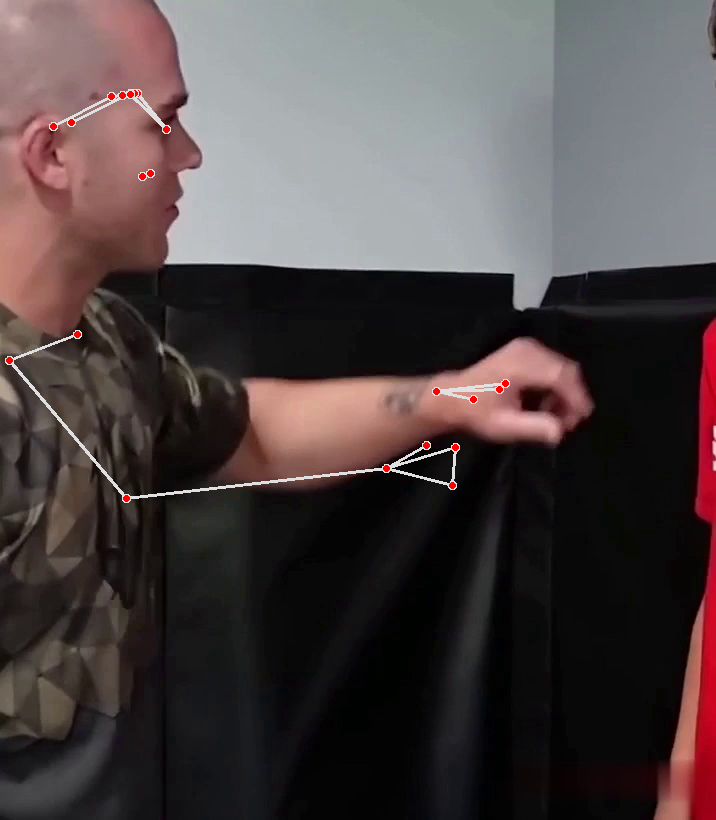

Frame read: True
Arm Angle: 19.61, Hand Speed: 0.0443


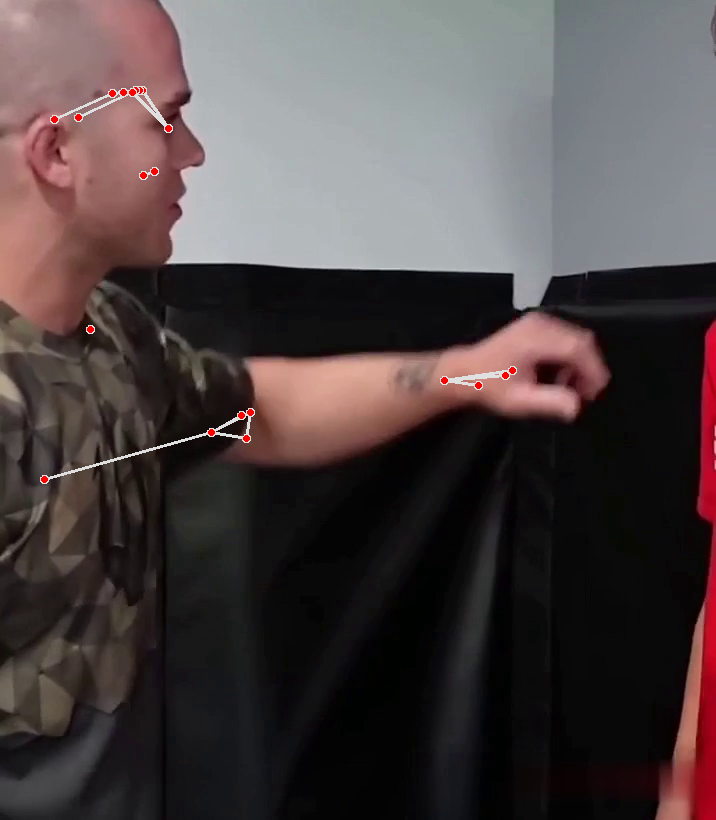

Frame read: True
Arm Angle: 23.03, Hand Speed: 0.0019


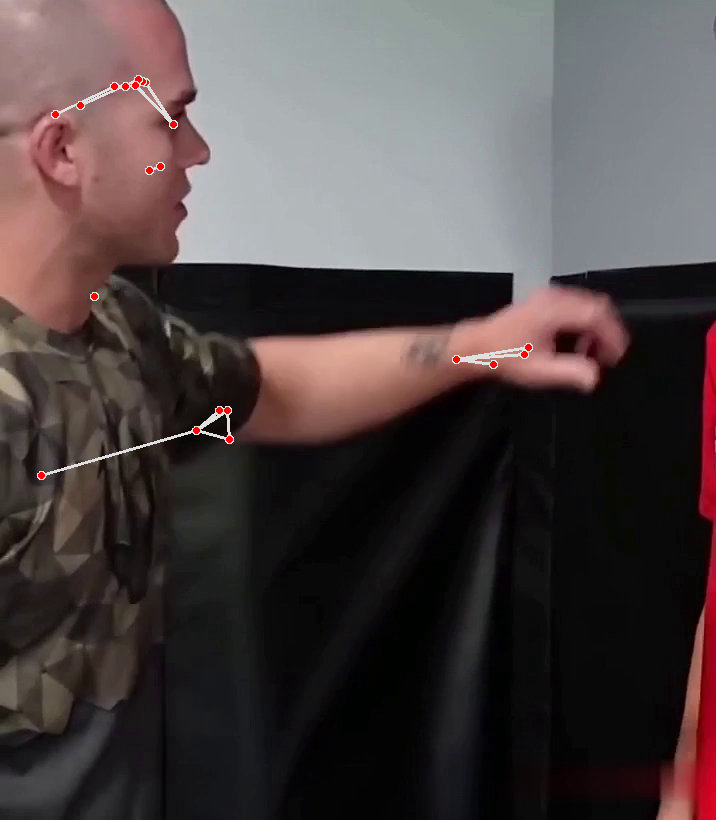

Frame read: True
Arm Angle: 10.88, Hand Speed: 0.0698


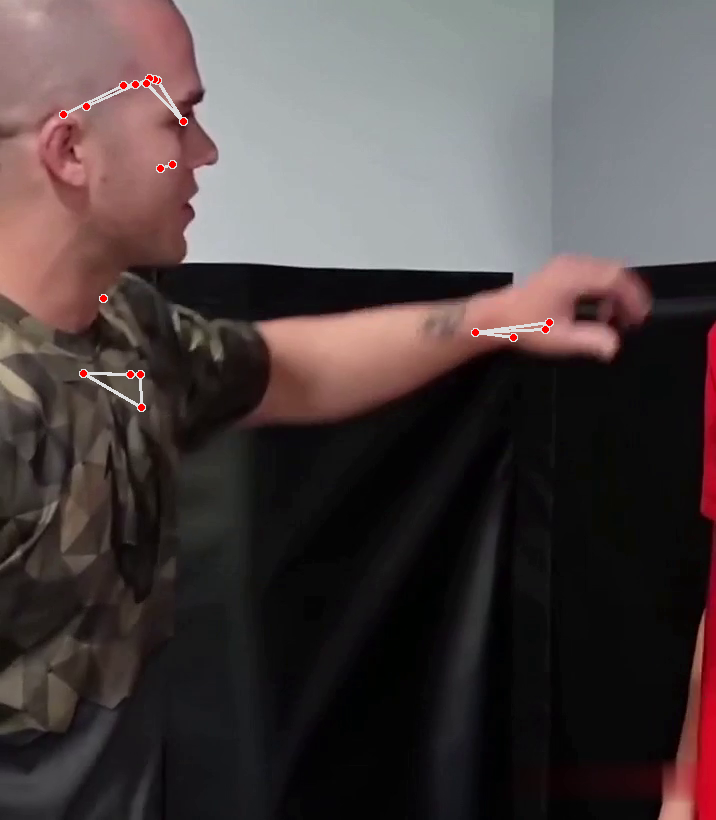

Frame read: True
Arm Angle: 3.82, Hand Speed: 0.0439


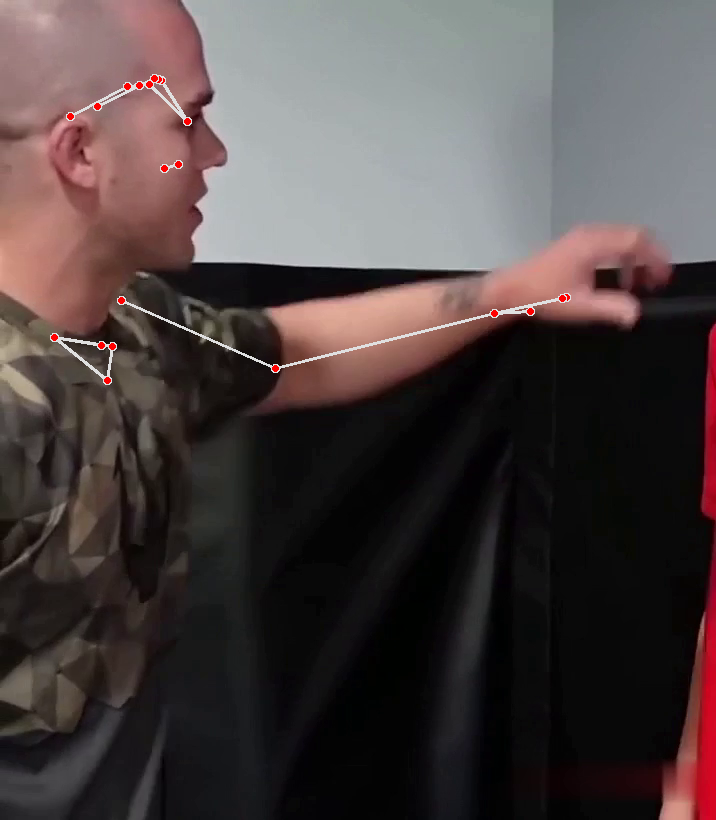

In [41]:
from google.colab.patches import cv2_imshow
import cv2
import mediapipe as mp


mp_pose = mp.solutions.pose
mp_draw = mp.solutions.drawing_utils
pose = mp_pose.Pose()


cap = cv2.VideoCapture("pose_detection_demo.mp4")

frame_count = 0
prev_wrist_y = None

while cap.isOpened():
    ret, frame = cap.read()
    print("Frame read:", ret)

    if not ret:
        break


    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = pose.process(rgb)

    if results.pose_landmarks:
        mp_draw.draw_landmarks(
            frame,
            results.pose_landmarks,
            mp_pose.POSE_CONNECTIONS
        )


        lm = results.pose_landmarks.landmark
        shoulder = lm[mp_pose.PoseLandmark.RIGHT_SHOULDER]
        wrist = lm[mp_pose.PoseLandmark.RIGHT_WRIST]


        arm_angle = abs(wrist.y - shoulder.y) * 180


        if prev_wrist_y is None:
            hand_speed = 0
        else:
            hand_speed = abs(wrist.y - prev_wrist_y)

        prev_wrist_y = wrist.y

        print(f"Arm Angle: {arm_angle:.2f}, Hand Speed: {hand_speed:.4f}")
    else:
        print("No pose detected")


    cv2_imshow(frame)

    frame_count += 1
    if frame_count == 5:  # only first 5 frames (Colab-safe)
        break

cap.release()